<a href="https://colab.research.google.com/github/ejf78/cdc_vitalsigns/blob/master/Vital_Signs_MiddleEast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# About This Notebook

This notebook contains functions for wrangling and visualizing BNIA's Baltimore vital sign indicators. The data has already been preprocessed to a standardized format. For more information, visit BNIA's [vital signs page](https://bniajfi.org/vital_signs/). 

## Set Up

In [1]:
# clone the github respository, so that we have all the necessary files 
!git clone https://github.com/ejf78/cdc_vitalsigns.git

Cloning into 'cdc_vitalsigns'...
remote: Enumerating objects: 147, done.
remote: Counting objects: 100% (147/147), done.
remote: Compressing objects: 100% (131/131), done.
remote: Total 147 (delta 70), reused 59 (delta 16), pack-reused 0
Receiving objects: 100% (147/147), 56.78 MiB | 9.87 MiB/s, done.
Resolving deltas: 100% (70/70), done.
Checking out files: 100% (40/40), done.


In [2]:
# install geopandas and mapclassify in google colab 
!pip install geopandas
!pip install mapclassify

     |████████████████████████████████| 1.0 MB 4.0 MB/s 
     |████████████████████████████████| 16.7 MB 41.0 MB/s 
     |████████████████████████████████| 6.3 MB 41.7 MB/s 


In [3]:
# load packages
import pandas as pd
import numpy as np
import os # for navigating directories
#import requests # for API pull 
import geopandas as gpd
import matplotlib.pyplot as plt
import math # for ceil function (round up)
import imageio # for animation 
import mapclassify # for legend in animated map
from IPython.display import Image # for displaying gifs
import plotly.express as px # for interactive plots
import plotly.graph_objects as go # for interactive plots

In [4]:
# navigate into the directory
os.chdir("cdc_vitalsigns")

In [5]:
## read vital signs data 
# vital signs (with geometry)
vs = pd.read_csv("full_vital_signs.csv")
# indicator info 
info = pd.read_csv("indicator_info.csv")

In [6]:
## read geometry data (for mapping in geopandas)
# read geojson (test)
csa_geo = gpd.read_file("csa_geometry.geojson")[["CSA2010", "geometry"]]
# correct CSA names to align with vs dataframe
csa_geo = csa_geo.rename(columns = {"CSA2010":"CSA"})
# read geojson for Baltimore City 
baltimore_geo = gpd.read_file("example_vs.geojson")[["City", "geometry"]]
baltimore_geo = baltimore_geo.rename(columns = {"City":"CSA"})
# combine into one geometry dataframe 
geo = csa_geo.append(baltimore_geo)

In [7]:
## combine data
# add geometry to vital sign data
vsg = vs.merge(geo, how = "left")
# add indicator description, where available 
vsg = vsg.merge(info[["indicator", "indicator_description"]], how = "left")
# turn into a geodataframe
vsg = gpd.GeoDataFrame(vsg)
vsg.head()

,CSA,indicator,year,value,year_numeric,geometry,indicator_description
0,Allendale/Irvington/S. Hilton,female,2000,10640.0,2000.0,"POLYGON ((-76.65726 39.27600, -76.65726 39.276...",Total Female Population
1,Beechfield/Ten Hills/West Hills,female,2000,7110.0,2000.0,"POLYGON ((-76.69479 39.30201, -76.69465 39.301...",Total Female Population
2,Belair-Edison,female,2000,9516.0,2000.0,"POLYGON ((-76.56761 39.32636, -76.56746 39.326...",Total Female Population
3,Brooklyn/Curtis Bay/Hawkins Point,female,2000,6972.0,2000.0,"MULTIPOLYGON (((-76.58867 39.21283, -76.58824 ...",Total Female Population
4,Canton,female,2000,3546.0,2000.0,"POLYGON ((-76.57140 39.28441, -76.57138 39.284...",Total Female Population


In [8]:
# view CSAs that are not geocoded
no_geometry = vsg[vsg.geometry.isna()]
set(no_geometry.CSA)
# These are the neighborhoods whose CSA boundaries changed in 2010

{'Jonestown/Oldtown',
 'Medfield/Hampden/Woodberry',
 'Perkins/Middle East',
 'Washington Village'}

## Functions

### Data Wrangling Functions

In [9]:
### Generic function to subset a dataframe 
# written with vital signs in mind, but flexible to use for other datasets 
def subset_dataframe(dataframe, columns, subset_vals,
                     condition_parameters = [" == "]): 
  '''
  Returns a subsetted dataframe
  *** 
  dataframe: a dataframe object (pandas or geopandas)
  columns: a list of columns (as strings) by which you'd like to subset the data 
  subset_val: a list of values by which to subset the data. The order must correspond to the order of the columns. 
  condition_parameters: a list of strings indicating the query relationship. MUST BE A LIST, even if it only contains one value. 
    Default will look for an exact match (==) for each column/subset value
    You may provide a list of parameters equal to the number of columns by which you're subsetting, 
    or you can provide a single parameter to apply to each column. 
    If using greater than or less than, the corresponding value must be numeric (both in the dataset and in the subset_vals list)
    example 1: condition_parameters = ["==",">", "=="] will query for an exact match for the first and third columns provided, and a greater than match for the second column. 
    example 2: condition_parameters = [">="] will query for a 'greater-than or equal to' match for every column

  The list of columns and the list of subset values must be the same length 

  The function works by constructing a string of filter conditions, and feeding it into panda's query function
  '''
  # create a list of condition parameters, if a single parameter (or no parameter) is provided
    # default is ' == '
  if len(condition_parameters) == 1: 
    condition_parameters = condition_parameters * len(columns)
  # empty string to hold the conditions
  condition = ''
  # loop to add conditions
  for i in range(0,len(columns)):
    if type(subset_vals[i]) == int or type(subset_vals[i])  == float:
      subset_val_string = str(subset_vals[i])
    elif type(subset_vals[i]) == list:   # if provided a list of exact values to filter for (such as multiple CSAs)
      subset_val_string = str(subset_vals[i])
    else: 
      subset_val_string = "'" + subset_vals[i] + "'" # add single quotes if it's not a numeric variable 
    condition = condition + " & " + columns[i] + condition_parameters[i] + subset_val_string
  # remove the first 3 characters in the condition (space & space)
  condition = condition[3:]
  #return condition # use this line for testing
  return dataframe.query(condition)

In [10]:
### Subset VSG data 
# a simpler subset function, only to be used for the vital signs geometry data
def subset_vsg(indicator = None,
               CSA = None,
               CSA_contains = None,
               CSA_list = None, 
               year_after = 1900, 
               year_before = 2100,
               retain_2006to2010 = False):
  '''
  Returns a subset of the VSG dataframe (vital signs with geometry)
  Gives the option to subset by a single CSA, multiple CSAs, or a specific string of text in the CSA column
  You should only ever use one of the three CSA parameters (CSA, CSA_contains, or CSA_list)
  ***
  indicator: string value for the indicator of interest. Only takes 1 indicator at a time 
  CSA: string value for a single CSA to subset for. Must be exact name as it appears in the data
  CSA_list: list of string values for CSAs to subset for. 
  CSA_contains: a string value to filter the CSA column by. For example, "Middle East" will return both "Perkins/Middle East and "Oldtown/Middle East"
  retain_2006to2010: boolean, option to retain 2006 to 2010 in the data
  '''
  vsg["year_numeric"] = vsg.year_numeric.fillna(year_after) # this helps retain "2006 - 2010"
  subset = vsg[(vsg.year_numeric >= year_after) & (vsg.year_numeric <= year_before)]
  if indicator is not None:
    subset = subset[subset.indicator == indicator]
  if CSA is not None: 
    subset = subset[subset.CSA == CSA]
  if CSA_contains is not None: 
    subset = subset[subset.CSA.str.contains(CSA_contains)]
  if CSA_list is not None: 
    subset = subset[subset.CSA.isin(CSA_list)]
  if retain_2006to2010 == False: 
    subset = subset[subset.year != "2006 - 2010"]
  return subset


In [11]:
### some examples: 
# subset_vsg(indicator = "female")
# subset_vsg(indicator = "paa", CSA_list =["Upton/Druid Heights","Southwest Baltimore"])
# subset_vsg(indicator = "aastud", year_after = 2008, year_before = 2018, CSA_contains = "Middle East")

### Visualization Functions


In [12]:
#### function to define right number of rows and columns for matplotlib subplots based on the number of datapoints available 
def subplot_dims(data_len):
  '''
  Given the length of data, returns the best option for dimensions (rows, columns)
  For use within other functions
  '''
  # if you have 5 or fewer plots, make it one row 
  if data_len <= 5:
    return 1, data_len
  ## determine best dimensions (try 4, then 5, then 3)
  if data_len%4 == 0: 
    return int(data_len/4), 4
  elif data_len%5 == 0:
    return int(data_len/5), 5
  elif data_len%3 == 0:
    return int(data_len/3), 3
  # but if none of that worked, choose the option with the lowest remained
  else: 
    # choose the number of columns with max remainder (we want the fewest empty graphs)
    remainders = [data_len%n for n in range(3, 7)] # allow up to 6 columns, with a minimum of 3 columns
    cols = int(remainders.index(max(remainders)) + 3) # index starts at 0, so we need to add three to get the desired number of columns
    rows = int(math.ceil(data_len / cols)) # round up to get the number of rows 
  return rows, cols

In [13]:
#### function to plot a single neighborhood for a single indicator over time (static plots)

def plot_neighborhood_static(dat, figsize = (4,5), title_font_size = 14, cmap = None, 
                             legend_orientation = "vertical",
                             manual_title_adjustment = 0.0,
                             title_text = None,
                             include_Baltimore_City = False):
  '''
  Returns a figure with several subplots, showing how an indicator has changed in a given neighborhood over time 
  ***
  dat: a geodataframe, subsetted to the desired neighborhood(s), indicator, and year(s)
  figsize: size of overall figure (tuple)
  title_font_size: how large the font should be (fontsize)
  cmap: color map for choropleth (set to default of None)
  legend_orientation: 'vertical' or 'horizontal'
  manual_title_adjustment: a float, representing how much to adjust the title. Can be negative or positive. 
  '''

  # error handling: this viz is set up for 1 indicator at a time. Stop if more than one indicator is in the data
  if len(set(dat.indicator)) > 1:
    return "Error: data contains more than one indicator. Please subset the data and try again."

  # remove Baltimore City from the data (since we are plotting individual CSAs) unless otherwise specified 
  if include_Baltimore_City: 
    pass 
  else:
    dat = dat[dat.CSA != "Baltimore City"]

  # get a list of years available, and make sure it's sorted
  yrs = [y for y in set(dat.year)]
  yrs.sort()
  # get the name of the csa(s), the indicator, and the indicator_description
  csa_s = [csa for csa in set(dat.CSA)]
  indicator = dat.indicator.iloc[0]
  ind_desc = dat.indicator_description.iloc[0]
  # figure out the dimensions of the figure subplots based on the number of years available
  rows, cols = subplot_dims(len(yrs))

  # set up the figure 
  fig, ax = plt.subplots(rows, cols, sharex = True, sharey = True, figsize = figsize)
  # set up title
  if(title_text is None):
    csa_title = ", \n".join(csa_s)
    figure_title = csa_title + "\n" + ind_desc
    fig.suptitle(figure_title, fontsize = title_font_size, y = (1 + manual_title_adjustment))
  # or use the manually added title 
  else: 
    fig.suptitle(title_text, fontsize = title_font_size, y = (1 + manual_title_adjustment))
  # set up min and max values to anchor the choropleth, so legend is consistent
  anchor_min = dat.value.min()
  anchor_max = dat.value.max()

  # loop to create plot 
  # set starting year index (which year to grab from the list of years)
  yr_i = 0
  # go row by row 
  for r in range(0, rows): # r is the row index (0 base)
    # column by column
    for c in range(0, cols):
      # leave blank if we ran out of data
      if yr_i >= len(yrs):
        ax[r, c].axis('off')
      else:
        # get data 
        mapdat = dat[dat.year == yrs[yr_i]]
        # plot (with some error handling, if there's only 1 row)
        if rows == 1:
          mapdat.plot("value", ax = ax[c], vmin = anchor_min, vmax = anchor_max, cmap = cmap)
          ax[c].set_axis_off()
          ax[c].set_title(yrs[yr_i]) # title is year 
        else: 
          mapdat.plot("value", ax = ax[r,c], vmin = anchor_min, vmax = anchor_max, cmap = cmap)
          ax[r,c].set_axis_off()
          ax[r,c].set_title(yrs[yr_i]) # title is year 
        # move to the next year (by increasing the year index by 1)
        yr_i += 1
      

  ## overall figure aesthetics 
  # set legend
  if rows == 1: 
    patch_col = ax[0].collections[0]
  else: 
    patch_col = ax[0,0].collections[0]
  fig.colorbar(patch_col, ax = ax, shrink = 0.8, orientation = legend_orientation)

  return fig.show()

Some examples: 



```
## error example
plot_neighborhood_static(vsg) # will throw an error, because it contains multiple indicators


## example 1: full city, custom title, custom figure size 
ex1 = subset_vsg("aastud")
plot_neighborhood_static(ex1, title_text = "Baltimore - AASTUD", figsize = (8,8))


## example 2: single CSA, subset by year, manually adjust title 
ex2 = subset_vsg("aastud", CSA = "Southwest Baltimore", year_after = 2010)
plot_neighborhood_static(ex2, figsize = (8, 4), manual_title_adjustment = -0.05) # move the title a little farther down 


## example 3: multiple CSAs, change legend orientation, change color map
csas = ['Beechfield/Ten Hills/West Hills','Allendale/Irvington/S. Hilton','Edmondson Village']
ex3 = subset_vsg("paa", CSA_list = csas, year_after = 2010)
plot_neighborhood_static(ex3, figsize = (8,5.5), legend_orientation = "horizontal", cmap = "summer", manual_title_adjustment = 0.05)
```



In [14]:
# example: 
#ex1 = subset_vsg("aastud")
#plot_neighborhood_static(ex1, title_text = "Baltimore - AASTUD", figsize = (8,8))

In [15]:
#### metafunction: view a static plot of an indicator, city wide, for a single year 
def baltimore_map(indicator, year, cmap = None, figsize = (5,5)):
  '''
  Takes a single indicator and a single year and plots a simple choropleth map of CSAs in Baltimore 
  ***
  indicator: string, indicator shortname as it appears in the data 
  year: string or numeric, year of data to show 
  '''
  # special subset option in the case of plotting 2006-2010 data 
  if year == "2006 - 2010":
    retain = True
  else: 
    retain = False
  mapdat = subset_vsg(indicator, retain_2006to2010= retain)

  # subset by year (numeric or string )
  if type(year) == int: 
    mapdat = mapdat[mapdat.year_numeric == year]
  else: 
    mapdat = mapdat[mapdat.year == year]
  # remove city-wide value
  mapdat = mapdat[mapdat.CSA != "Baltimore City"]

  # plot 
  title_text = mapdat.indicator_description.iloc[0] + ",\n" + str(year)
  fig, ax = plt.subplots(1,1)
  mapdat.plot("value", ax = ax, legend = True, cmap = None)
  ax.set_title(title_text)
  ax.set_axis_off()
  plt.rcParams["figure.figsize"] = figsize
  return plt.show()



In [16]:
### some examples
#baltimore_map("pwhite", 2020)
#baltimore_map("crime", 2010)
#baltimore_map("mhhi", "2006 - 2010")

In [17]:
#### function to create a line plot for an indicator for one or more CSAs 
def selected_line_plot(csas, indicator, color_list = None, figsize = (5,5),
                       legend_loc = "best", 
                       year_before = 2100,
                       year_after = 1900):
  '''
  Takes a list of CSAs, an indicator, and a few other custom specifications to create a line plot
  ***
  csas: list of CSA names as they appear in the data 
  indicator: string, indicator to plot. Can only plot one indicator at a time 
  color_list: list of color names (must be the same length as the number of CSAs)
  figsize: tuple, set size of figure
  legend_loc: string, allows you to specify where to place the legend (more info: https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.legend.html)
  year_before: numeric, filter to before this year 
  year_after: numeric, filter to after this year 
  '''
  # get data 
  linpltdat = subset_vsg(indicator = indicator, CSA_list = csas)
  linpltdat = linpltdat[linpltdat.year_numeric.notna()]
  linpltdat = linpltdat[(linpltdat.year_numeric >= year_after) & (linpltdat.year_numeric <= year_before)]
  # grab indicator description 
  ind_desc = linpltdat.indicator_description.iloc[0]
  # plot (no specified colors)
  if color_list == None:
    for csa in csas:
      lindat = linpltdat[linpltdat.CSA == csa] 
      plt.plot(lindat.year_numeric, lindat.value, label = csa)
  # plot (specified colors [must be same length as number of CSAs])
  else: 
    for i in range(0, len(csas)):
      lindat = linpltdat[linpltdat.CSA == csas[i]]
      plt.plot(lindat.year_numeric, lindat.value, label = csas[i], color = color_list[i])

  # aesthetics 
  plt.legend(loc = legend_loc)
  plt.title(ind_desc)
  xticks = list(set(linpltdat.year_numeric))
  plt.xticks(xticks)
  plt.rcParams["figure.figsize"] = figsize
  plt.show()

Some examples:



```
# Example 1: 
csas = ['Beechfield/Ten Hills/West Hills','Allendale/Irvington/S. Hilton','Edmondson Village'] # according to BNIA map, these are next to each other 
selected_line_plot(csas, "gunhom", legend_loc = "upper right")

# Example 2: same as example 1, but change the colors
selected_line_plot(csas, "gunhom", color_list = ["teal","yellowgreen","cornflowerblue"])

# Example 3: subset by year 
selected_line_plot(['Harford/Echodale','Hamilton','Lauraville'],"unempl", year_after = 2010)

# Example of a poor visualization: missing years of data causes issues 
selected_line_plot(['Harford/Echodale','Hamilton','Lauraville'],"unempl") 
```



In [18]:
# example: 
#selected_line_plot(['Harford/Echodale','Hamilton','Lauraville'],"unempl", year_after = 2010)

In [19]:
#### highlight line plot 

def highlight_line_plot(indicator,csa_of_interest, year_before = 2050, year_after = 1990,
                        figsize = (5,5), highlight_color = "orange",
                        plot_baltimore = False, baltimore_color = "blue",
                        legend_loc = "best", 
                        alpha = 0.25):
  '''
  Function to create a line plot with one highlighted line of interest 
  ***
  indicator: the shortname of the indicator of interest
  csa_of_interest: the CSA to be highlighted 
  year_before: filter to all years less than or equal to this year  (2050 as a placeholder)
  year_after: filter to all years greater than or equal to this year (1990 as a placeholder)
  plot_baltimore: boolean, determines whether or not to include a line for baltimore 
  figsize: dimensions of the figure 
  highlight_color: color of the line of interest 
  legened_loc: location of the legend 
  alpha: transparency level of the grey lines (default is 0.25)
  '''
  linpltdat = subset_vsg(indicator = indicator)
  # filter out NA values, filter to desired time frame 
  linpltdat = linpltdat[linpltdat.year_numeric.notna()]
  linpltdat = linpltdat[(linpltdat.year_numeric >= year_after) & (linpltdat.year_numeric <= year_before)]
  # grab indicator description 
  ind_desc = linpltdat.indicator_description.iloc[0]

  # plot line of interest
  csadat = linpltdat[linpltdat.CSA == csa_of_interest]
  plt.plot(csadat.year_numeric, csadat.value, label = csa_of_interest, color = highlight_color,
           linewidth = 2)
  
  # plot baltimore, if desired 
  if plot_baltimore:
    try:
      baltdat = plotdat[plotdat.CSA == "Baltimore City"]
      plt.plot(lindat.year_numeric, lindat.value, label = None, 
             color = baltimore_color, linewidth = 1)
    except: 
      print("Note: no Baltimore City data available")

  ## plot all other lines
  # get list of all other CSAs
  other_csas = set(linpltdat.CSA)
  other_csas.remove(csa_of_interest)
  try: 
    other_csas.remove("Baltimore City")
  except: 
    pass
  # loop through other csas
  for csa in other_csas: 
    lindat = linpltdat[linpltdat.CSA == csa] 
    plt.plot(lindat.year_numeric, lindat.value, label = None, 
             color = "grey", alpha = alpha, linewidth = 1) # grey out aesthetics

  # aesthetics 
  plt.legend(loc = legend_loc)
  title_text = ind_desc + "\n" + csa_of_interest + " vs. other CSAs"
  plt.title(title_text)
  xticks = list(set(linpltdat.year_numeric))
  plt.xticks(xticks)
  plt.rcParams["figure.figsize"] = figsize
  plt.show()

In [20]:
# example
# highlight_line_plot("paa", "Fells Point", year_after = 2015,
#                     figsize = (8, 4), legend_loc = "upper right", 
#                     plot_baltimore = True)

In [89]:
#### metafunction: line plot showing the top, bottom, and middle CSAs of a given indicator
def indicator_lineplot(indicator, 
                       top_color = "m", mid_color = "orange", bottom_color = "c",
                       year_before = 2100, year_after = 1900,
                       alpha = 0.25, 
                       plot_baltimore = False, baltimore_color = "blue", 
                       figsize = (8,5)):
  '''
  Provides a line plot of all Baltimore CSAs for a given indicator, highlighting the top, bottom, and middle (median) CSAs
  Option to also plot Baltimore City as its own line 
  ***
  indicator: string, indicator short name as it appears in the data 
  top_color: string, color of the top CSA line
  mid_color: string, color of the middle CSA line 
  bottom_color: string, color of the bottom CSA line
  year_before: integer, for subsetting data by year 
  year_after: integer, for subsetting data by year 
  alpha: float, between 0 and 1, how transparent the grey CSA lines should be 
  plot_baltimore: boolean, option to include a line for Baltimore City, if data is available. Default = False 
  baltimore_color: string, color of the Baltimore City line 

  '''
  # grab data, determine top/bottom/middle CSAs
  plotdat = subset_vsg(indicator = indicator, year_before = year_before, year_after = year_after)
  latest_year = plotdat.year_numeric.max()
  latest_dat = plotdat[plotdat.year_numeric == latest_year]
  top_csa = latest_dat[latest_dat.value == latest_dat.value.max()].CSA.iloc[0]
  bottom_csa = latest_dat[latest_dat.value == latest_dat.value.min()].CSA.iloc[0]
  middle_csa = latest_dat[latest_dat.value == latest_dat.value.median()].CSA.iloc[0]
  # highlighted_csas = [top_csa, bottom_csa, middle_csa]
  other_csas = set(plotdat.CSA)
  other_csas.remove(top_csa)
  other_csas.remove(bottom_csa)
  other_csas.remove(middle_csa)
  # separate Baltimore City data, if available. Since Baltimore City is not available for every indicator in every year, need to use error handling here. 
  try:
    other_csas.remove("Baltimore City")
  except: 
    pass
  ## plot the top/bottom/middle CSAs
  # top 
  lindat = plotdat[plotdat.CSA == top_csa]
  label_x = int(latest_year)
  label_y = lindat[lindat.year_numeric == int(latest_year)].value.iloc[0]
  plt.plot(lindat.year_numeric, lindat.value, color = top_color)
  plt.annotate(top_csa, (label_x, label_y), 
               bbox = dict(boxstyle = "round", fc = "0.8", facecolor = 'white', edgecolor = top_color))
  # mid 
  lindat = plotdat[plotdat.CSA == middle_csa]
  label_x = int(latest_year)
  label_y = lindat[lindat.year_numeric == int(latest_year)].value.iloc[0]
  plt.plot(lindat.year_numeric, lindat.value, color = mid_color)
  plt.annotate(middle_csa, (label_x, label_y), 
               bbox = dict(boxstyle = "round", fc = "0.8", facecolor = 'white', edgecolor = mid_color))
  # bottom 
  lindat = plotdat[plotdat.CSA == bottom_csa]
  label_x = int(latest_year)
  label_y = lindat[lindat.year_numeric == int(latest_year)].value.iloc[0]
  plt.plot(lindat.year_numeric, lindat.value, color = bottom_color)
  plt.annotate(bottom_csa, (label_x, label_y), 
               bbox = dict(boxstyle = "round", fc = "0.8", facecolor = 'white', edgecolor = bottom_color))
  # plot the other CSAs
  for csa in other_csas:
    lindat = plotdat[plotdat.CSA == csa] 
    plt.plot(lindat.year_numeric, lindat.value, label = None, 
              color = "grey", alpha = alpha, linewidth = 1)
  # plot Baltimore City, if specified and if available
  if plot_baltimore:
    try:
      lindat = plotdat[plotdat.CSA == "Baltimore City"]
      latest_year = lindat.year_numeric.max()
      label_x = latest_year
      label_y = lindat[lindat.year_numeric == latest_year].value.iloc[0]
      plt.plot(lindat.year_numeric, lindat.value, color = baltimore_color)
      plt.annotate("Baltimore City", (label_x, label_y), 
                  bbox = dict(boxstyle = "round", fc = "0.8", facecolor = 'white', edgecolor = baltimore_color))
    except: 
      print("Note: no Baltimore City data available")
  # plot aesthetics 
  xticks = list(set(plotdat.year_numeric))
  plt.xticks(xticks)
  title_text = plotdat.indicator_description.iloc[0] + ",\nBaltimore CSAs"
  plt.title(title_text)
  plt.rcParams["figure.figsize"] = figsize
  return  plt.show()

In [98]:
### some examples 
#indicator_lineplot("paa")
#indicator_lineplot("mhhi", year_after = 2010)
#indicator_lineplot("tanf")
#indicator_lineplot("empl")
#indicator_lineplot("ownroc", plot_baltimore = True, year_before = 2010)

### Interactive and Animated Visualization Functions

In [23]:
#### metafunction: plotly lineplot of all CSAs. Interactive, so you can hover over a line to see which CSA it is 
def interactive_indicator_lineplot(indicator,
                                   year_before = 2100, year_after = 1900,
                                   plot_baltimore = True, baltimore_color = "blue"):
  dat = subset_vsg(indicator = indicator, year_before = year_before, year_after = year_after)
  csas = set(dat.CSA)
  try:
    csas.remove("Baltimore City") # test
  except: 
    pass
  title_text = dat.indicator_description.iloc[0]
  #px.line(dat, x = "year_numeric", y = "value")
  fig = go.Figure()
  for csa in csas:
    lindat = dat[dat.CSA == csa]
    fig.add_traces(go.Scatter(x = lindat.year_numeric, y = lindat.value, mode = "lines", name = csa,
                               text = lindat["CSA"],
                                hoverinfo = 'text',
                                hovertext = lindat["CSA"],
                                hovertemplate = '%{hovertext}<br>Year: %{x}<br>Value: %{y}',
                              line = dict(color = "black", width = 1.5)))
  fig.update_layout(hoverlabel = dict(bgcolor = "white")) #, hoverlabel_font_color = "black"
  fig.update_traces(line = dict(color = "lightgrey"))
  if plot_baltimore: 
    try:
      lindat = dat[dat.CSA == "Baltimore City"]
      fig.add_traces(go.Scatter(x = lindat.year_numeric, y = lindat.value, mode = "lines", name = "Baltimore City",
                                text = lindat["CSA"],
                                hoverinfo = 'text',
                                hovertext = lindat["CSA"],
                                hovertemplate = '%{hovertext}<br>Year: %{x}<br>Value: %{y}',
                                hoverlabel = dict(font = dict(color = baltimore_color)),
                                line = dict(color = baltimore_color, width = 2)))
    except:
      print("Note: no Baltimore City data available")
  xticks = list(set(dat.year_numeric))
  fig.update_layout(showlegend=False, plot_bgcolor="white", title = dict(text = title_text),
                    xaxis = dict(tickmode = 'array',
                                tickvals = xticks, 
                                ticktext = xticks)
                    )
  return fig.show()

In [24]:
### some examples
#interactive_indicator_lineplot("paa")
#interactive_indicator_lineplot("paa", year_after = 2015)
#interactive_indicator_lineplot("ownroc", year_before = 2010)

In [55]:
#### animated map (saved as a gif)
def baltimore_gif(indicator, CSA_list = None, year_before = 2050, year_after = 1990,
                  duration = 0.2,
                  gif_title = None, output_dir = None, gif_filename = None):

  # get data for relevant indicator 
  if CSA_list is None:
    df = subset_vsg(indicator)
  else: 
    df = subset_vsg(indicator, CSA_list= CSA_list)
  # remove rows of full-city data
  df = df[df.CSA != "Baltimore City"]
  # subset by year 
  df = df[df.year_numeric >= year_after]
  df = df[df.year_numeric <= year_before]

  # set up output directory (user can provide an output directory name if desired)
  if(output_dir is None):
    output_dir = indicator + "_gif_images"
  os.makedirs(output_dir, exist_ok = True) # overwrites directory if the same name already exists
  # list to store image names 
  image_filenames = []

  # set gif title (user can also provide one)
  if(gif_title is None):
    gif_title = df.indicator_description.iloc[0]
  # get years to loop through 
  yrs_for_gif = [y for y in set(df.year_numeric)]
  # set min and max for legend 
  vmin_gif = df.value.min()
  vmax_gif = df.value.max()
  
  # TO DO: normalize the color anchors of the legend

  # sample map, to grab a common legend 
  mapdata = df[df.year_numeric == yrs_for_gif[0]]
  fig1 = mapdata.plot("value", legend = True, norm = plt.Normalize(vmin = vmin_gif, vmax = vmax_gif))
  shared_legend = fig1.axes.collections[0]
  chart = fig1.get_figure()
  plt.close(chart)


  # loop to create individual images 
  for yr in yrs_for_gif: 
    mapdata = df[df.year_numeric == yr]
    fig = mapdata.plot("value", legend = False, # legend is false. we will manually add a legend
                       norm = plt.Normalize(vmin = vmin_gif, vmax = vmax_gif))
    fig.axis('off')
    fig.set_title(gif_title, fontsize = 14)
    fig.annotate(str(int(yr)), xy = (0.25, 0.15), xycoords = "figure fraction", fontsize = 16)
    plt.colorbar(shared_legend)
    # save to output folder 
    filepath = output_dir + "/image_" + str(int(yr)) + ".jpg"
    image_filenames.append(filepath)
    chart = fig.get_figure()
    plt.close(chart) # don't display 
    # save image to output directory 
    chart.savefig(filepath, dpi = 300)

  # reload images and save as gif 
  images = []
  for i in image_filenames:
    images.append(imageio.imread(i))
  # set gif file name, if not set by user
  if(gif_filename is None):
    gif_filename = indicator + "_Baltimore.gif"
  imageio.mimsave(gif_filename,images, duration = duration)
  print(f".gif has been created. The file name is: {gif_filename}")

  return 

In [96]:
# quick function to open a gif 
def open_gif(filename, width = None, height = None):
  return Image(open(filename, 'rb').read(), width = width, height = height)

In [101]:
### example
#baltimore_gif("mhhi") # create gif
#open_gif('mhhi_Baltimore.gif', width = 500, height = 500) # open gif in this notebook, using the filename 

# Middle East EDA (Exploratory Data Analysis)

How has Middle East changed in the last 20 years? I'll make use of my functions to explore the data and start to create a story

In [27]:
# first, what are Middle East CSA names? the boundaries have changed 
set(vsg[vsg.CSA.str.contains("Middle East")].CSA)

{'Oldtown/Middle East', 'Perkins/Middle East'}

### Income, Unemployment, Business

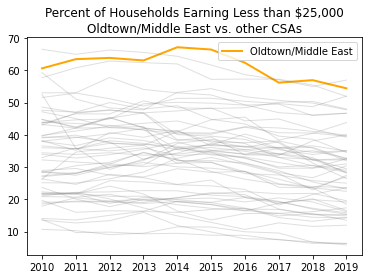

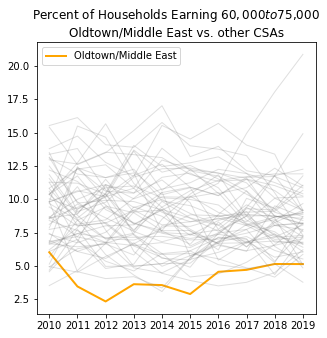

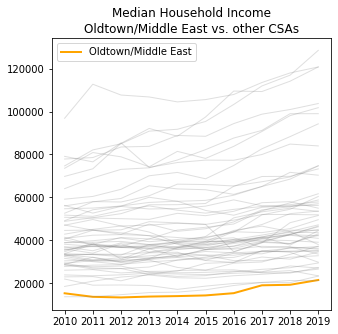

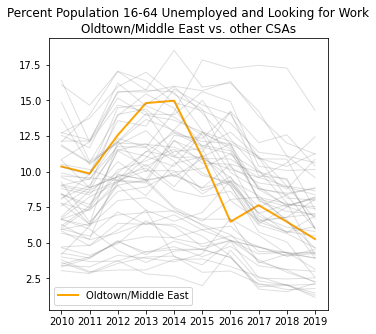

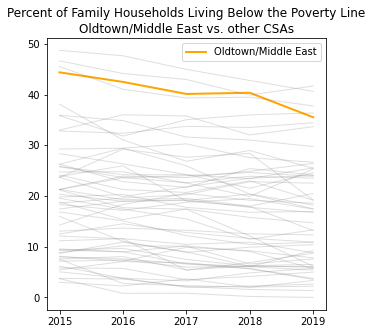

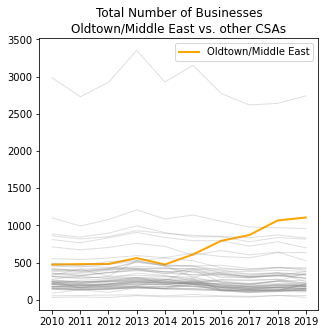

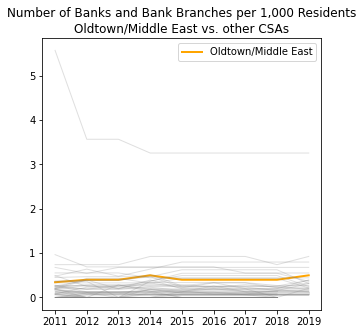

In [28]:
### line plots 
# helpful in seeing how Mid East compares to other neighborhoods 



## INCOME / UNEMPLOYMENT / BUSINESSES

# percent earning less than 25k
highlight_line_plot("hh25inc", "Oldtown/Middle East", year_after = 2010)
# highlight_line_plot("hh25inc", "Perkins/Middle East", year_before = 2010) # 2 yrs of data

# percent over 75k
highlight_line_plot("hh75inc", "Oldtown/Middle East", year_after = 2010)
#highlight_line_plot("hh75inc", "Perkins/Middle East", year_before = 2010)

# median household income 
highlight_line_plot("mhhi", "Oldtown/Middle East", year_after = 2010) # bottom of the pack

# unemployment rate
highlight_line_plot("unempl", "Oldtown/Middle East", year_after = 2010) # big decrease after 2014

# households below the poverty line 
highlight_line_plot("hhpov", "Oldtown/Middle East", year_after = 2010)

# number of businesses
highlight_line_plot("numbus", "Oldtown/Middle East", year_after = 2010) # big increase! 

# number of banks 
highlight_line_plot("banks", "Oldtown/Middle East", year_after = 2010) # small increase, not a lot of variety in the data

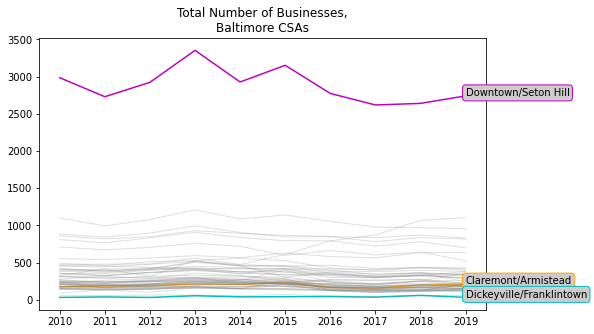

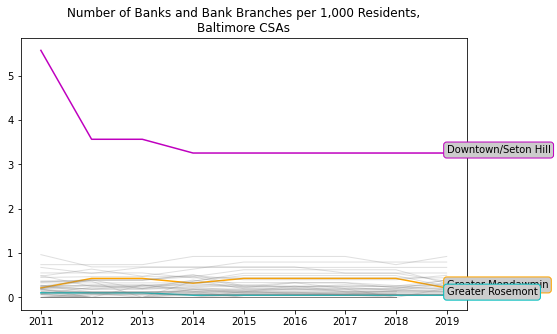

In [90]:
# number of businesses was interesting, because one line was much higher than others (probably a downtown area)
indicator_lineplot("numbus", year_after = 2010)

# same with number of banks 
indicator_lineplot("banks", year_after = 2010)


### Demographics

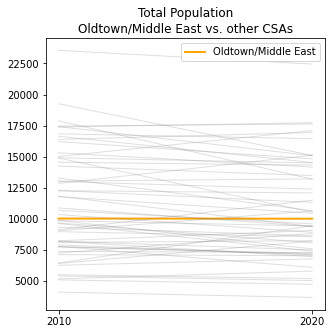

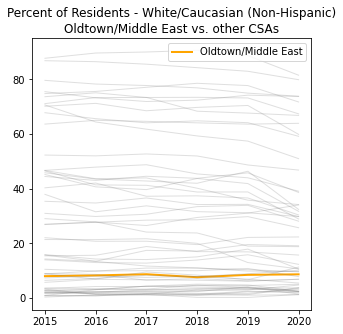

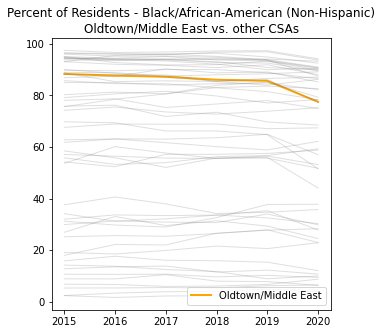

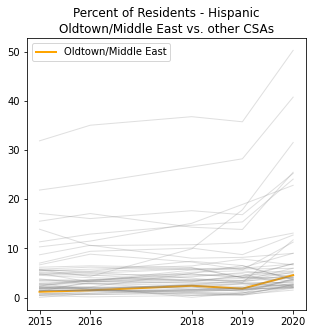

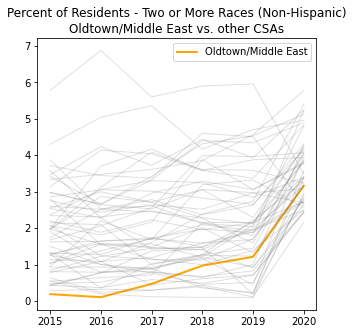

...

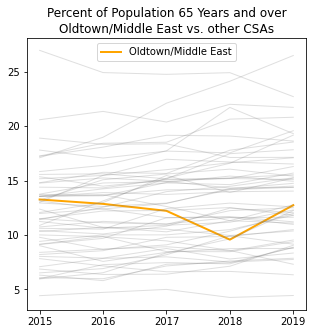

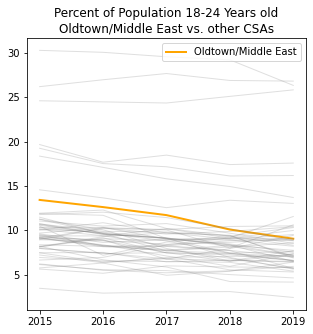

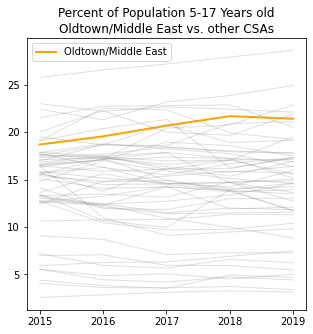

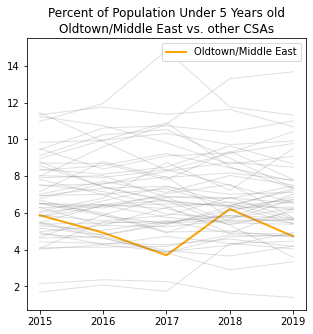

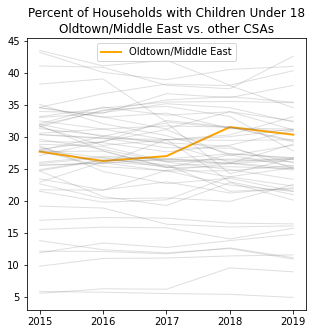

In [65]:
## DEMOGRAPHICS 

# total pop 
highlight_line_plot("tpop", "Oldtown/Middle East", year_after = 2010) # not a major change in population 

# percent white
highlight_line_plot("pwhite", "Oldtown/Middle East", year_after = 2015)

# percent AA 
highlight_line_plot("paa", "Oldtown/Middle East", year_after = 2015,legend_loc = "lower right")

# percent hispanic 
highlight_line_plot("phisp", "Oldtown/Middle East", year_after = 2015)

# percent 2 or more races 
highlight_line_plot("p2more", "Oldtown/Middle East", year_after = 2015)

# racial diversity index
highlight_line_plot("racdiv", "Oldtown/Middle East", year_after = 2010)

# percent 65 and older 
highlight_line_plot("age65_", "Oldtown/Middle East", year_after = 2015)

# percent 18 to 24 yrs old 
highlight_line_plot("age24_", "Oldtown/Middle East", year_after = 2015) # fewer younger people

# percent 5 - 17 yrs old 
highlight_line_plot("age18_", "Oldtown/Middle East", year_after = 2015) # more children 

# percent below 5 
highlight_line_plot("age5_", "Oldtown/Middle East", year_after = 2015)

# percent hhs with children 
highlight_line_plot("fam", "Oldtown/Middle East", year_after = 2015) # increase in families 

# total number of households 
#highlight_line_plot("hhs", "Oldtown/Middle East", year_after = 2010) #only 2 years of data 

# average household size 
#highlight_line_plot("hhsize", "Oldtown/Middle East") # no data!

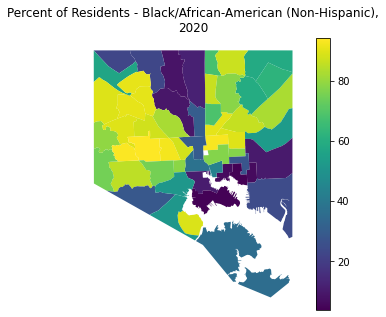

In [31]:
# PAA was interseting - let's visualize on a map 
baltimore_map("paa", year = 2020, figsize = (10,8))

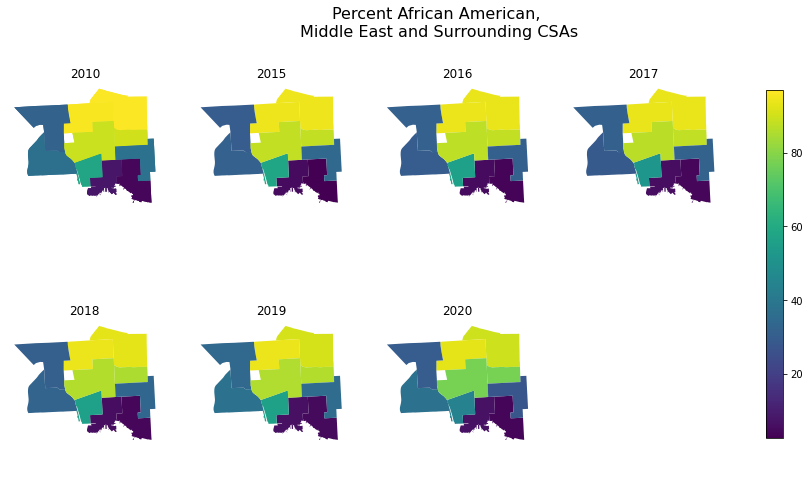

In [39]:
## and see how it changed over time, compared to surrounding neighborhoods 
# subset the data 
ME_surrounding_CSAs =  ["Oldtown/Middle East", "Greenmount East", "Clifton-Berea", "Harbor East/Little Italy", 
                        "Downtown/Seton Hill", "Midtown", "Fells Point", "Canton", "Patterson Park North & East", 
                        "Canton","Madison/East End"]
paa_ME_dat = subset_vsg(indicator = "paa",  CSA_list = ME_surrounding_CSAs, year_after =2010)
# plot using a function 
plot_neighborhood_static(paa_ME_dat, title_text = "Percent African American, \nMiddle East and Surrounding CSAs", 
                         figsize = (16, 8), manual_title_adjustment = -0.05, title_font_size = 16)

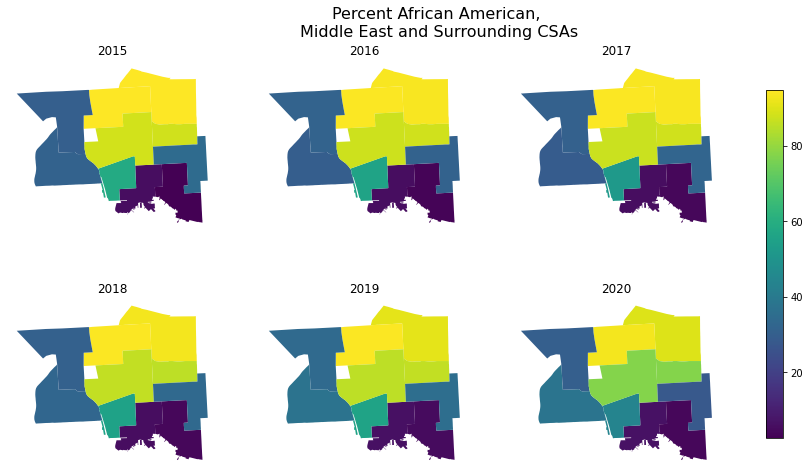

In [41]:
# re-do that plot, with some formatting changes 
paa_ME_dat_2 = subset_vsg(indicator = "paa",  CSA_list = ME_surrounding_CSAs, year_after =2015)
plot_neighborhood_static(paa_ME_dat_2, title_text = "Percent African American, \nMiddle East and Surrounding CSAs", 
                          figsize = (16, 8), manual_title_adjustment = -0.05, title_font_size = 16)

In [ ]:
set(vsg[vsg.CSA.str.contains("Patterson")].CSA)

### Crime

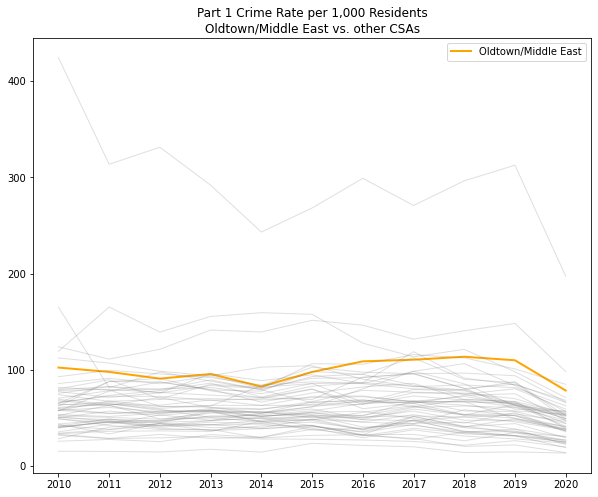

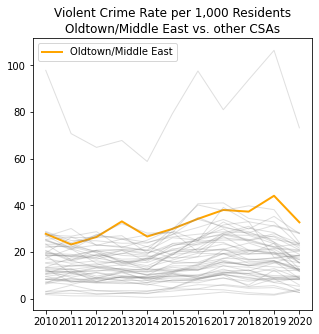

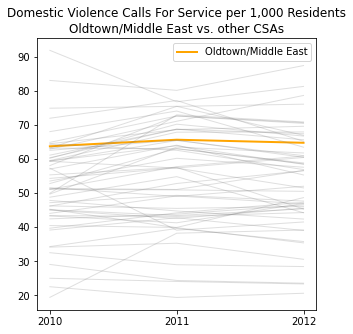

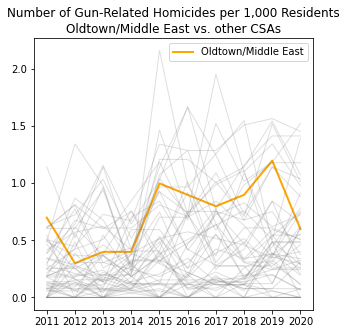

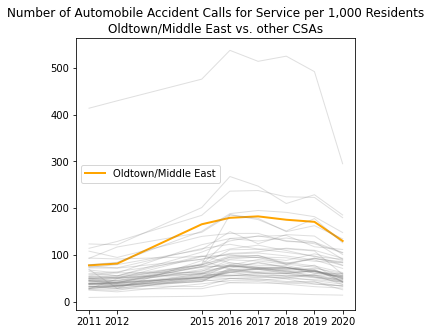

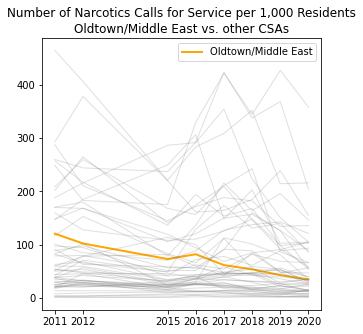

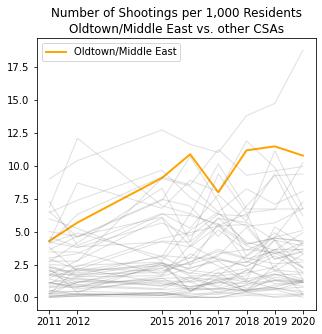

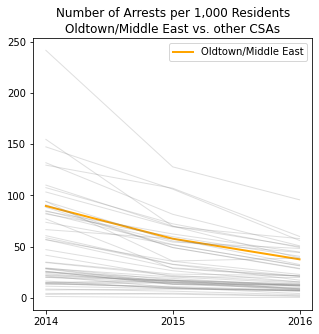

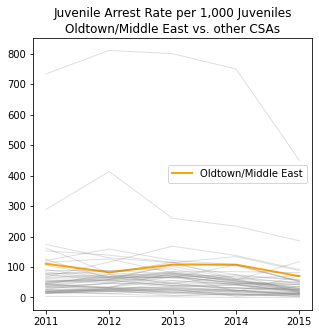

In [42]:
## CRIME AND SAFETY 

# part 1 crime rate
#highlight_line_plot("crime", "Oldtown/Middle East", year_after = 2010)

# violent crime rate 
#highlight_line_plot("viol", "Oldtown/Middle East", year_after = 2010)

# gun homicides 
# highlight_line_plot("gunhom", "Oldtown/Middle East", year_after = 2010)


# loop through a bunch of plots 
plot_indicators = ["crime", "viol", "domvio", "gunhom", "caracc", "narc", "shoot", "arrest", "juvarr"]
for ind in plot_indicators: 
  highlight_line_plot(ind, "Oldtown/Middle East", year_after = 2010)

.gif has been created. The file name is: shoot_MEarea.gif


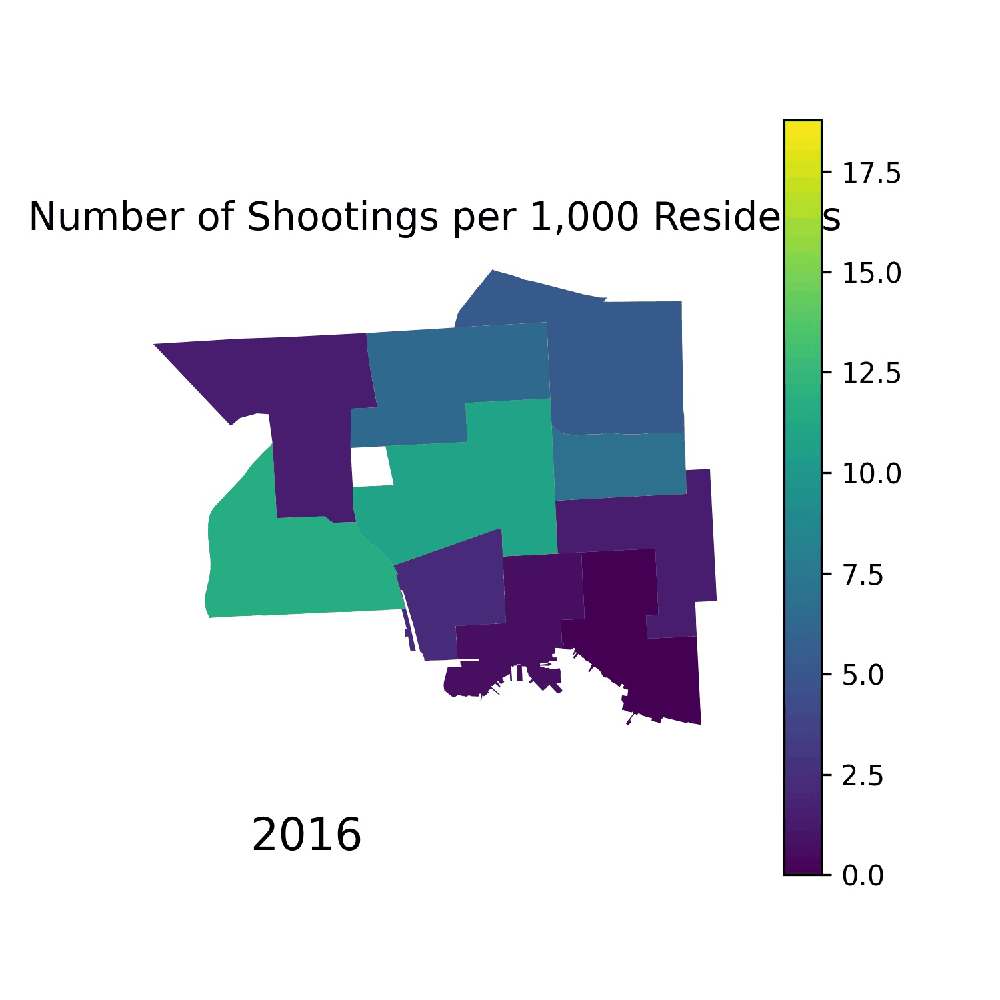

In [102]:
# how do shootings in Middle East compare to its surrounding CSAs? 
baltimore_gif("shoot", CSA_list = ME_surrounding_CSAs, year_after = 2015, duration = 0.8,
              gif_filename = "shoot_MEarea.gif")
open_gif("shoot_MEarea.gif", width = 600, height = 600)

### Education

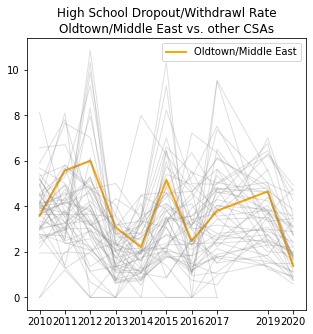

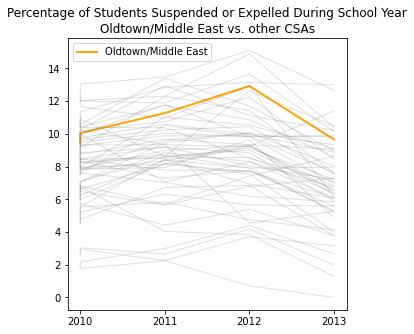

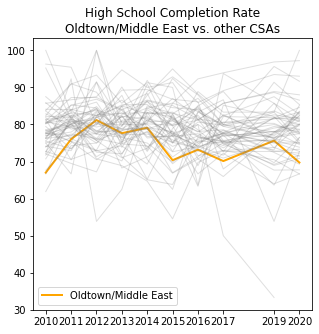

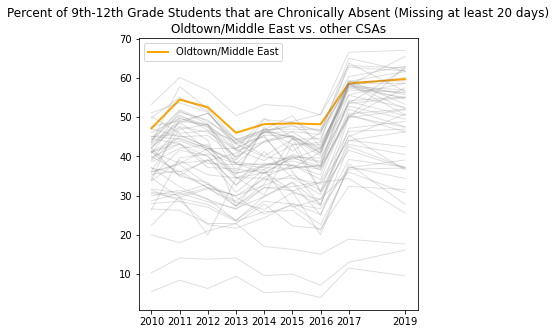

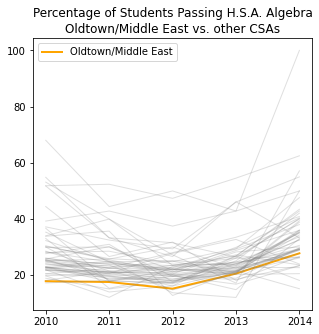

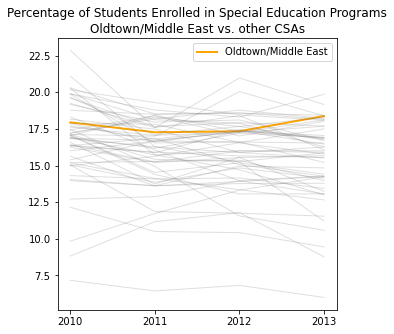

In [66]:
## EDUCATION 

# loop through a bunch of plots 
plot_indicators = ["drop", "susp","compl","abshs", "hsaalg","sped"]
for ind in plot_indicators: 
  highlight_line_plot(ind, "Oldtown/Middle East", year_after = 2010)

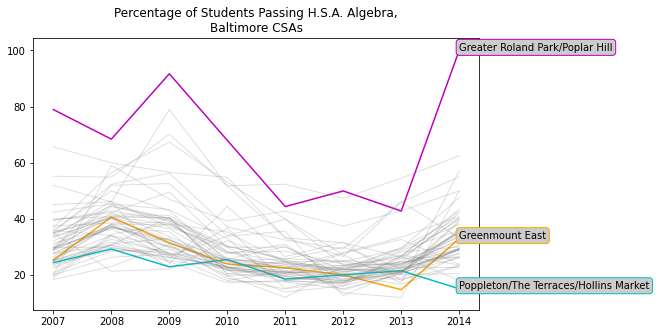

In [91]:
# there is a lot of variety in % passing HS algebra. Let's look at the top and bottom CSAs in comparison to other CSAs
indicator_lineplot("hsaalg")

### Housing

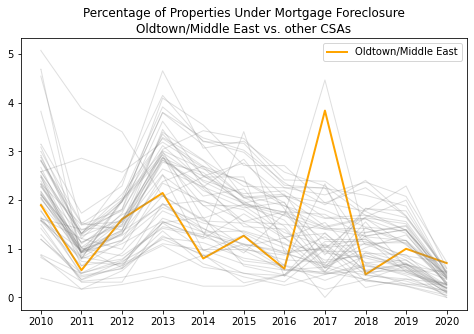

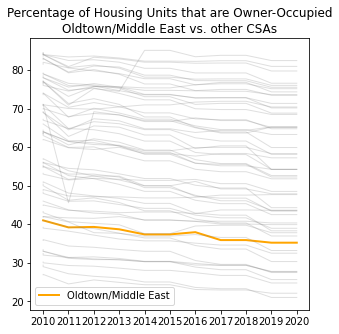

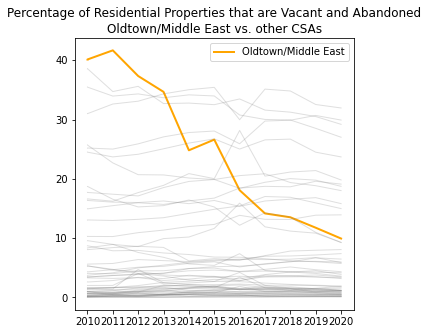

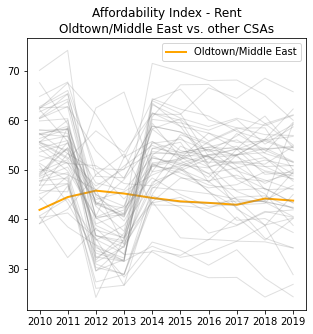

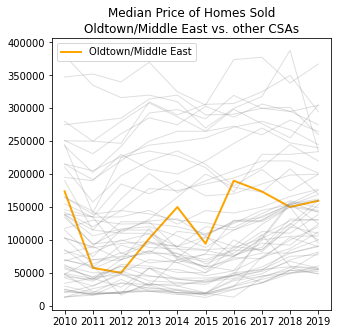

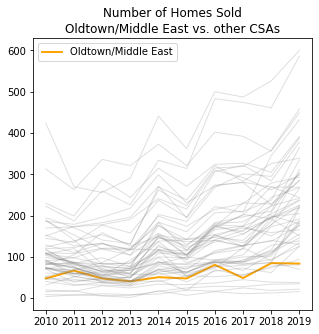

In [92]:
## HOUSING 

# loop through a bunch of plots 
plot_indicators = ["fore", "ownroc","vacant","affordr", "salepr","shomes"]
for ind in plot_indicators: 
  highlight_line_plot(ind, "Oldtown/Middle East", year_after = 2010)

In [93]:
# lots of interesting stuff here
# let's look at affordability index, which has a lot of variability, but not in Middle East
interactive_indicator_lineplot("vacant")

.gif has been created. The file name is: ownroc_Baltimore.gif


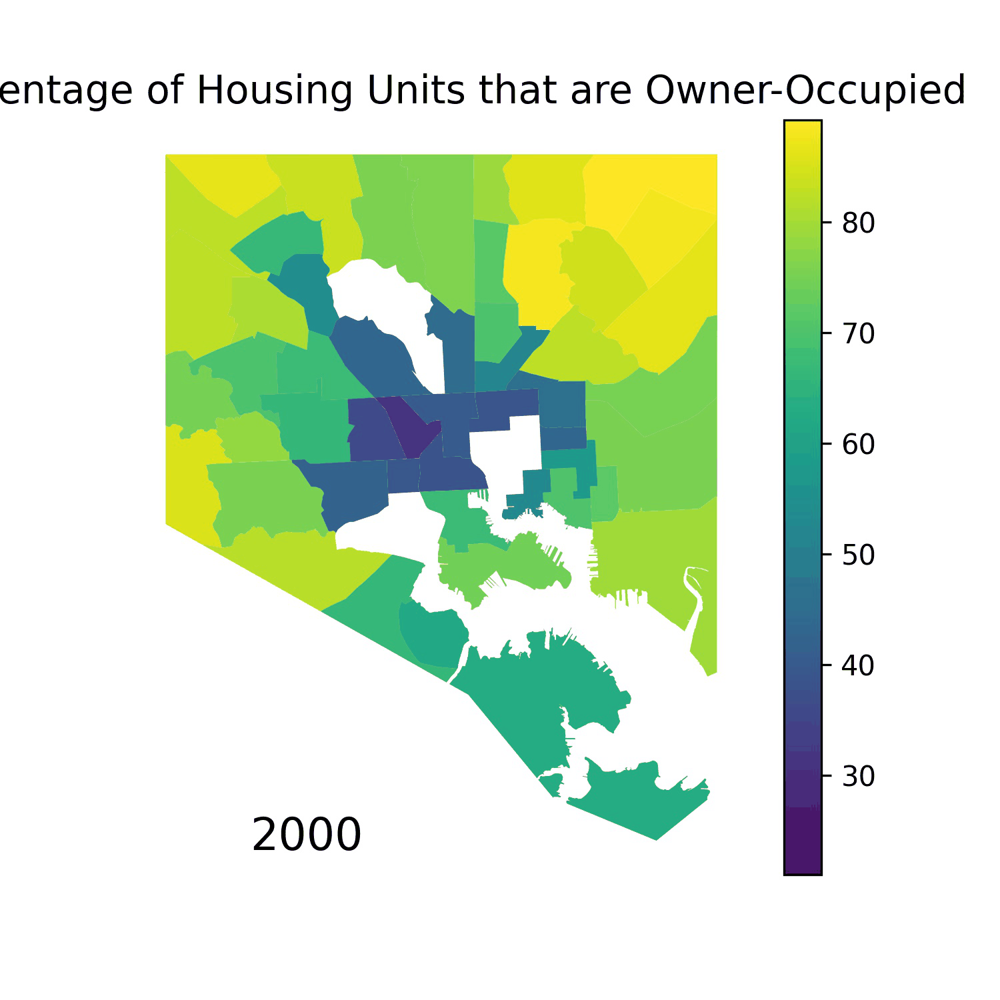

In [105]:
# the line plot showed citywide patterns with owner occupied units 
# let's look at all of baltimore over time 
baltimore_gif("ownroc", duration = 0.5)
open_gif("ownroc_Baltimore.gif", width = 600, height = 600)